<a href="https://colab.research.google.com/github/Evandro72/NGramByLanguage/blob/main/NGramByLanguage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 981 kB 5.2 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=6def800d8f95bc59723d887e705fd7d56b9365b0f365eba2f2d7b135bd7ec5d6
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [2]:
pip install pycountry

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.1 MB 5.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681845 sha256=3ed484987fddba0d3b71650b7a62d06ea5b40131aa05c62f707baa389e8f3a67
  Stored in directory: /root/.cache/pip/wheels/0e/06/e8/7ee176e95ea9a8a8c3b3afcb1869f20adbd42413d4611c6eb4
Successfully built pycountry


In [3]:
pip install swifter

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 830 kB 5.2 MB/s 
     |████████████████████████████████| 291 kB 64.6 MB/s 
     |████████████████████████████████| 1.6 MB 43.3 MB/s 
  Created wheel for swifter: filename=swifter-1.3.4-py3-none-any.whl size=16322 sha256=58e0e71ac96b9c061b018e96308fb619f5da2e5fea73648ab7668c458beb0ed3
  Stored in directory: /root/.cache/pip/wheels/29/a7/0e/3a8f17ac69d759e1e93647114bc9bdc95957e5b0cbfd405205
Successfully built swifter
  Attempting uninstall: psutil
    Found existing installation: psutil 5.4.8
    Uninstalling psutil-5.4.8:
      Successfully uninstalled psutil-5.4.8


In [4]:
from PIL import Image
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure
from langdetect import detect
import random
import pycountry
import swifter

In [5]:
# Creating Language Dict
Languages = {}

for lang in pycountry.languages:
    try:
        Languages[lang.alpha_2] = lang.name
    except:
        pass

In [6]:
# Tweets were based on these Languages 
Unique_Lang_Code = ['it', 'da', 'zh-cn', 'en', 'lt', 'fr', 'sl', 'hu', 'sq', 'sv', 'uk', 'sk', 'ca', 'lv', 'af', 'th', 'no', 'fi', 'vi', 'de', 'cy', 'ja', 'nl', 'es', 'cs', 'ro', 'tl', 'pl', 'id', 'fa', 'ru', 'et', 'sw', 'tr', 'pt', 'el', 'so', 'hr']

In [8]:
# Reading CSV File
df = pd.read_csv('Tweets.csv')

In [9]:
# Filtering Tweets on Language

for index, tweet in enumerate(df['Cleaned_Tweet']):
    try:
        languade_2code = detect(tweet)
        df.loc[index, 'Language'] = Languages[languade_2code]        
    except:
        df[index, 'Language'] = 'Unknown'        

In [10]:
# Break into N Grams
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

def get_ngrams(text, n=1):
    text = str(text)
    n_grams = ngrams(text.split(), n)
    returnVal = []
    
    try:
        for grams in n_grams:
            returnVal.append('_'.join(grams))
    except(RuntimeError):
        pass
        
    return ' '.join(returnVal).strip()

In [14]:
# Replacing Text
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('UmbriaJazzOFC','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('umbriajazz','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Umbria Jazz','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('jazz','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Umbria','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('musica','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('perugia','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Santa Giuliana','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Perugia','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Umbria','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Lady Gaga','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('UMBRIA','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Morlacchi','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('IV Novembre','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Jazz','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('live','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('music','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('italy','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('luglio','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('amp','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('festival','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('orvieto','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('umbria','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Orvieto','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('Italy','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('JAZZ','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('july','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('great','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('night','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('July','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('uj','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('UJ','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('concerto','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('UJ','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('oggi','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('grande','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('La','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('via','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('palco','')
df['Cleaned_Tweet'] = df['Cleaned_Tweet'].str.replace('grazie','')

In [15]:
# Bigram
df['bigram_text'] = df['Cleaned_Tweet'].swifter.apply(get_ngrams, n=1)

Pandas Apply:   0%|          | 0/25055 [00:00<?, ?it/s]

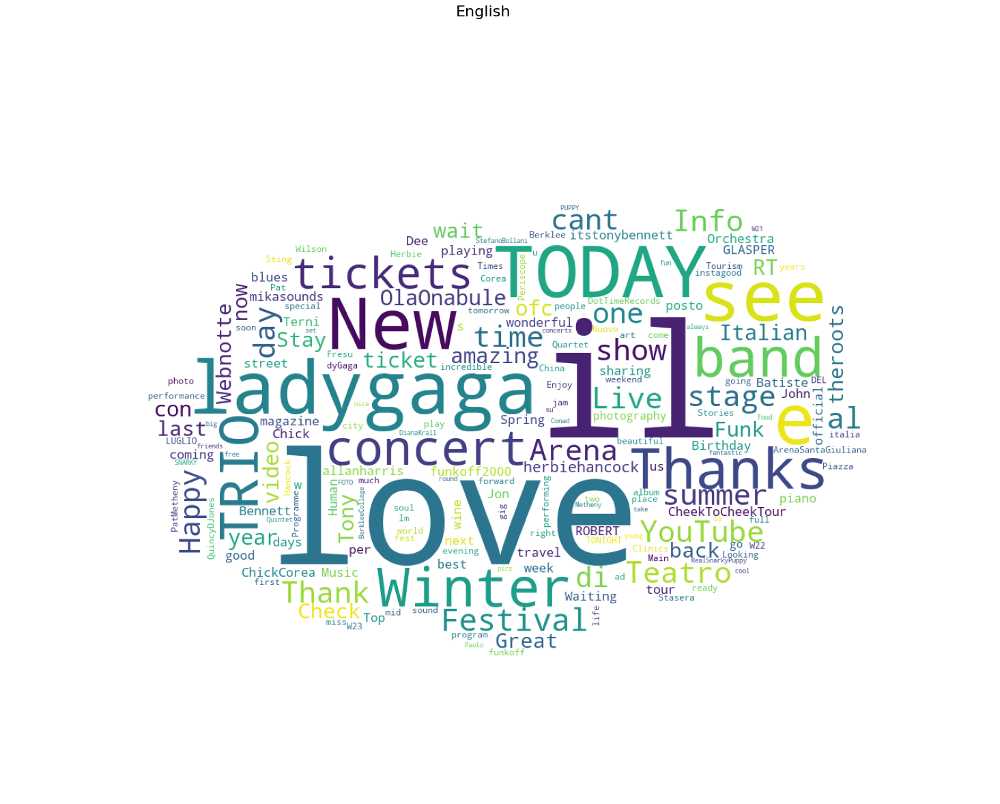

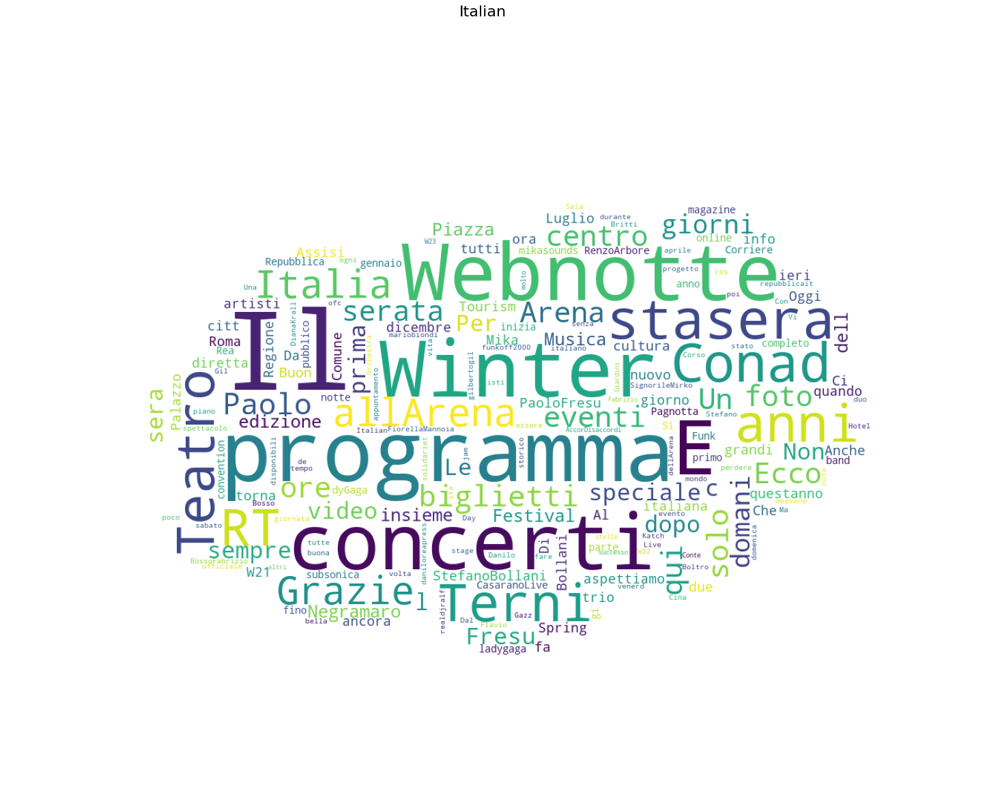

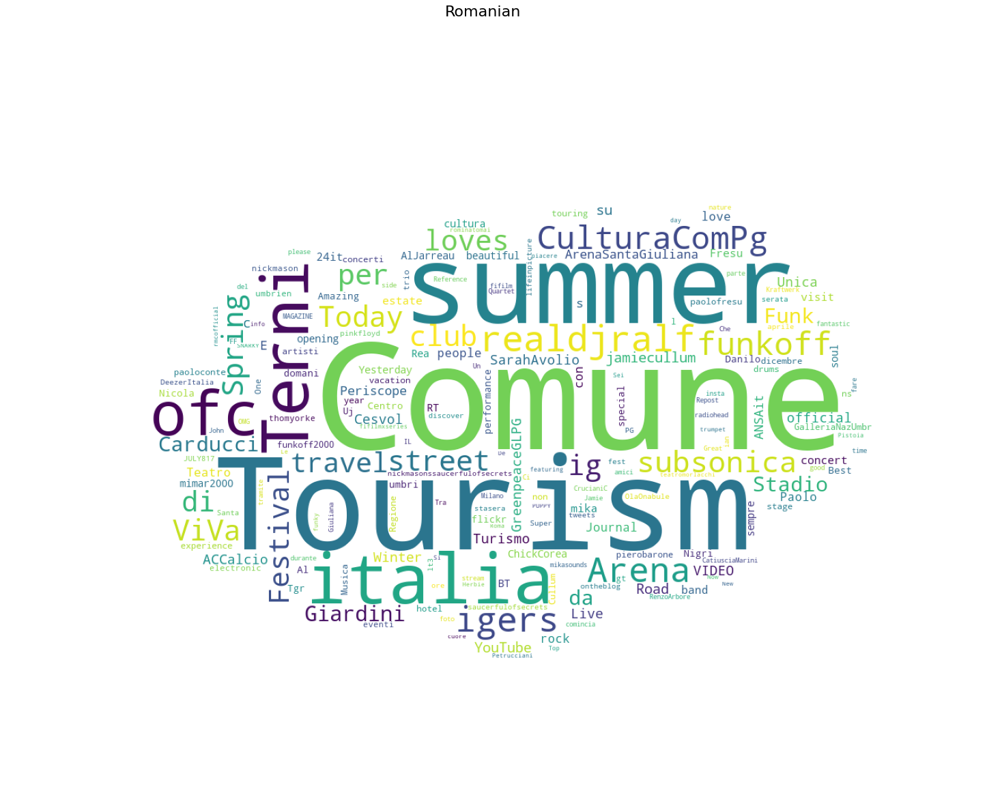

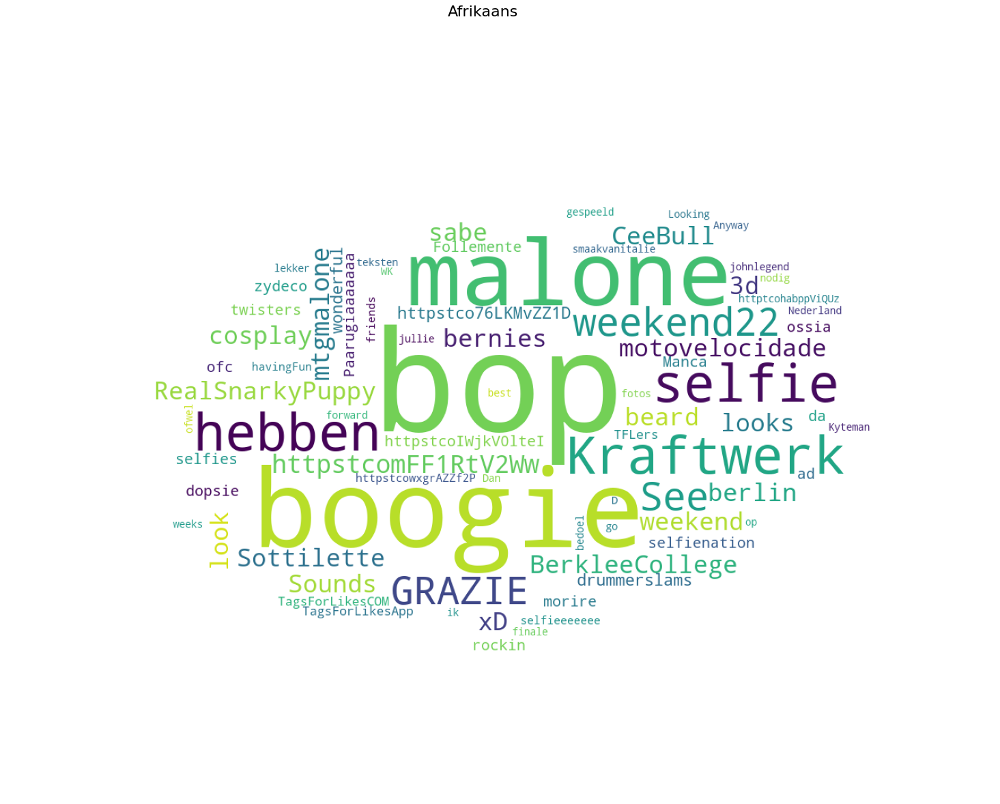

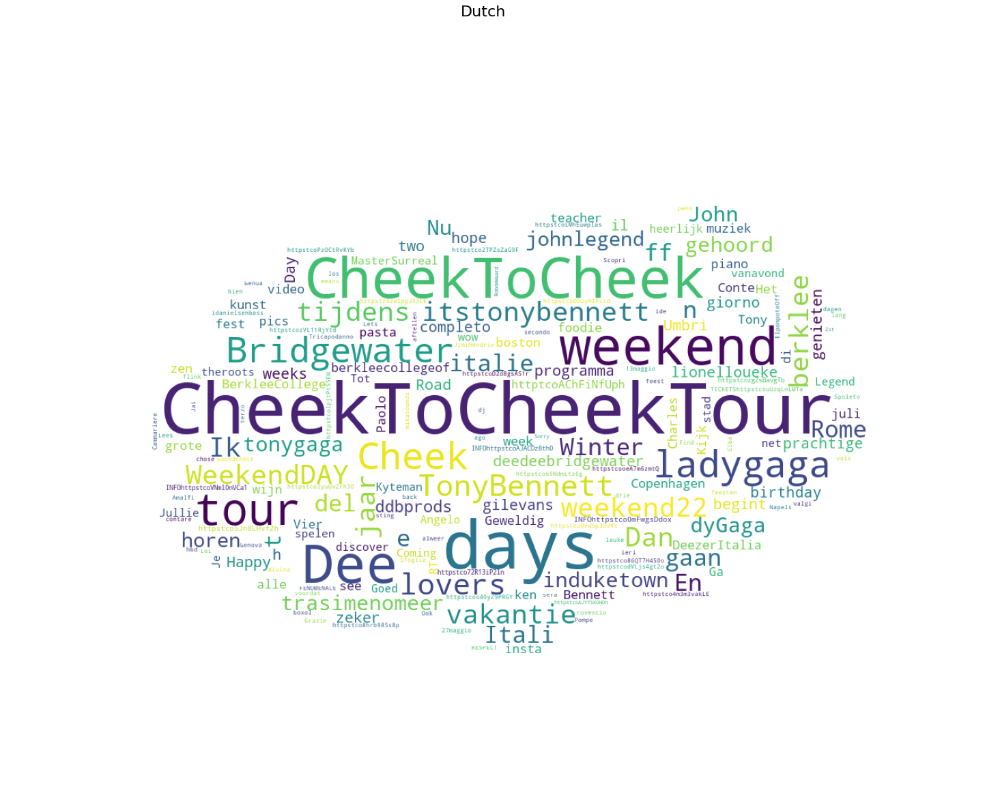

...

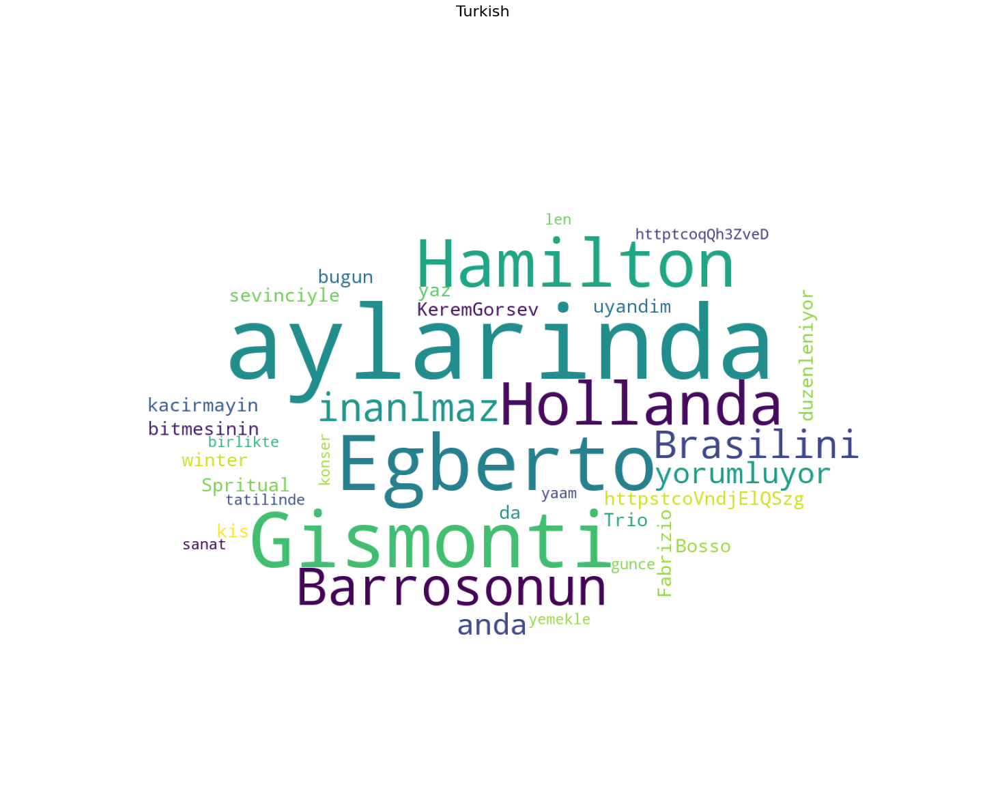

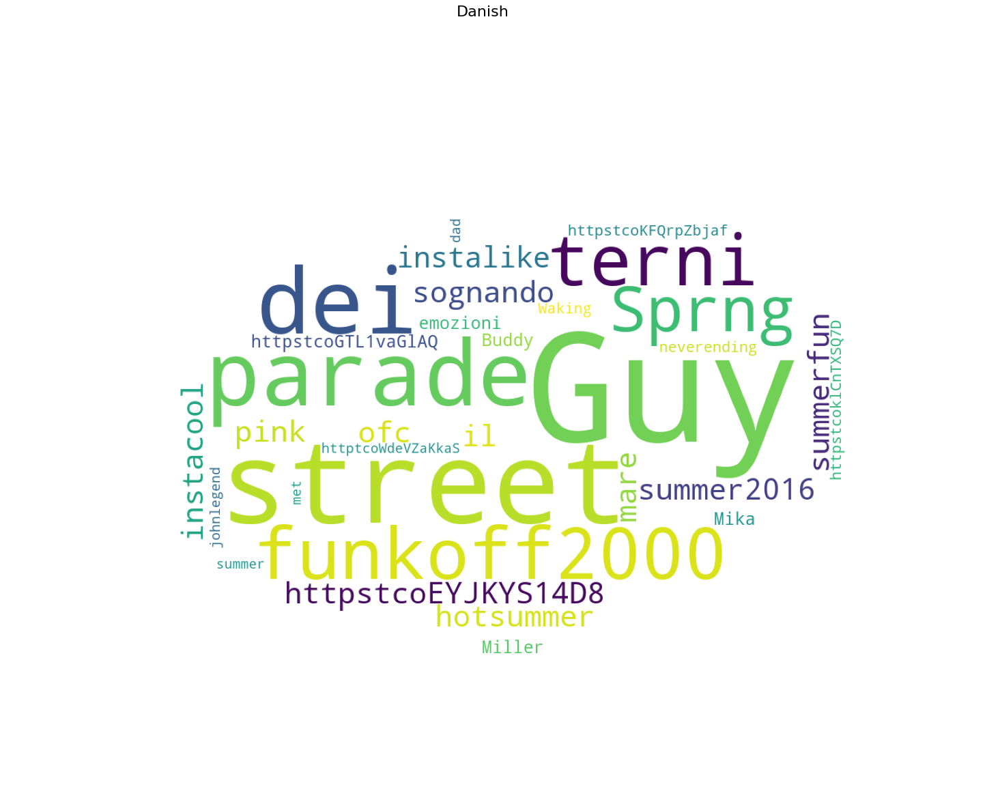

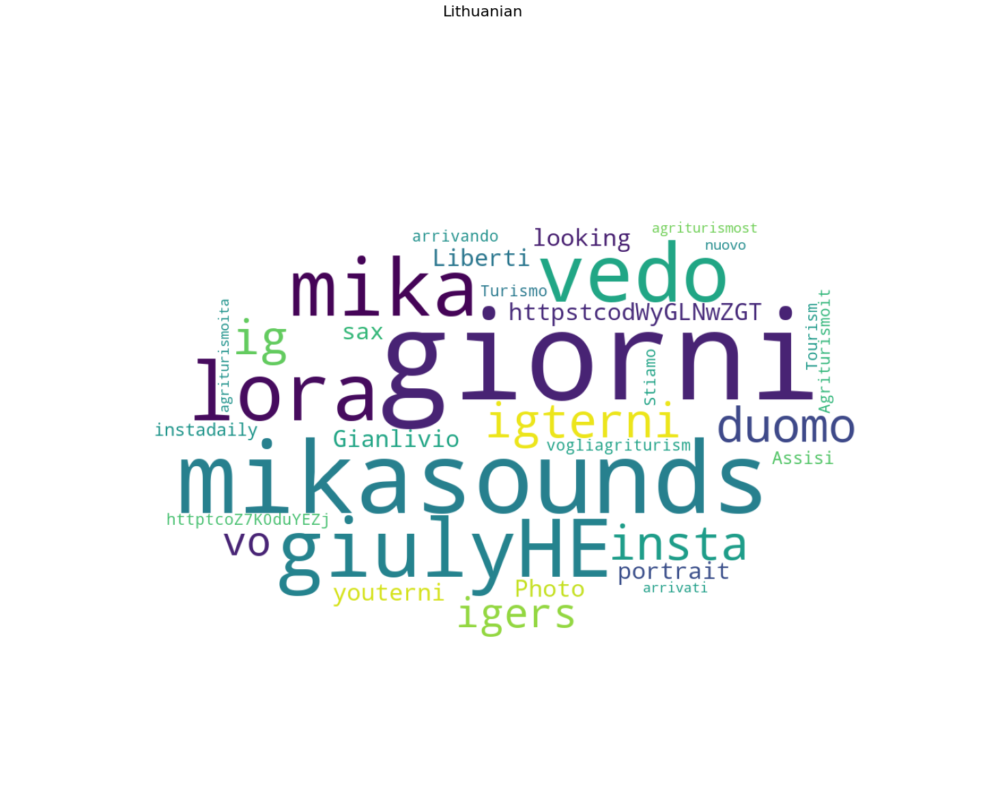

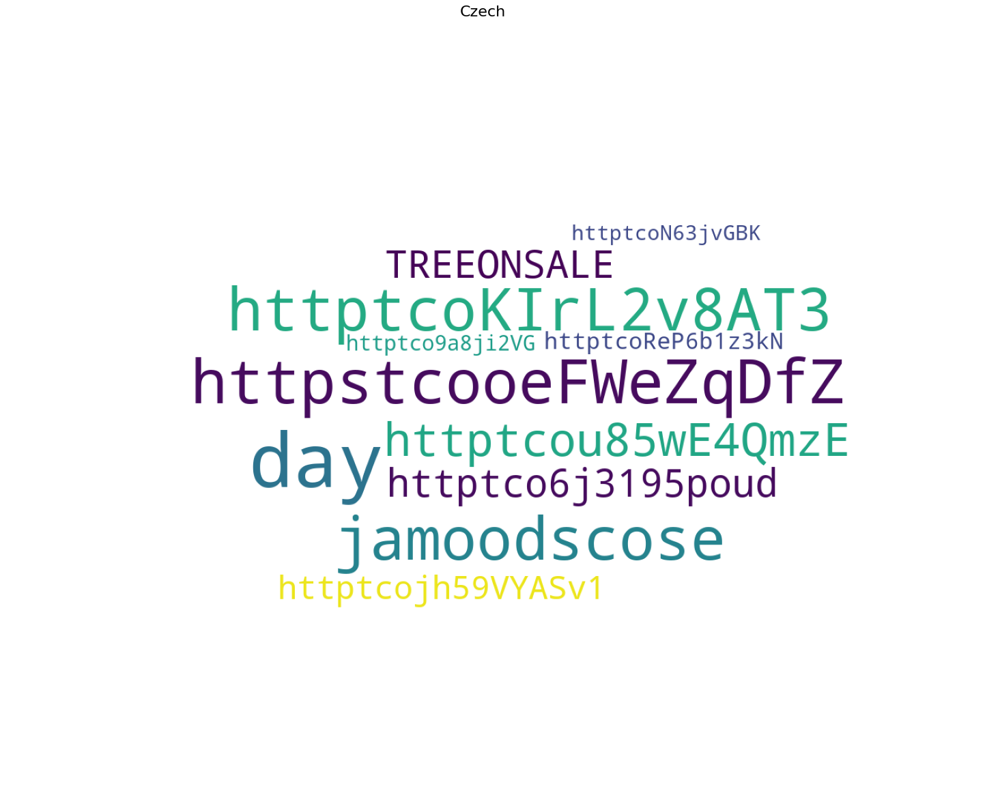

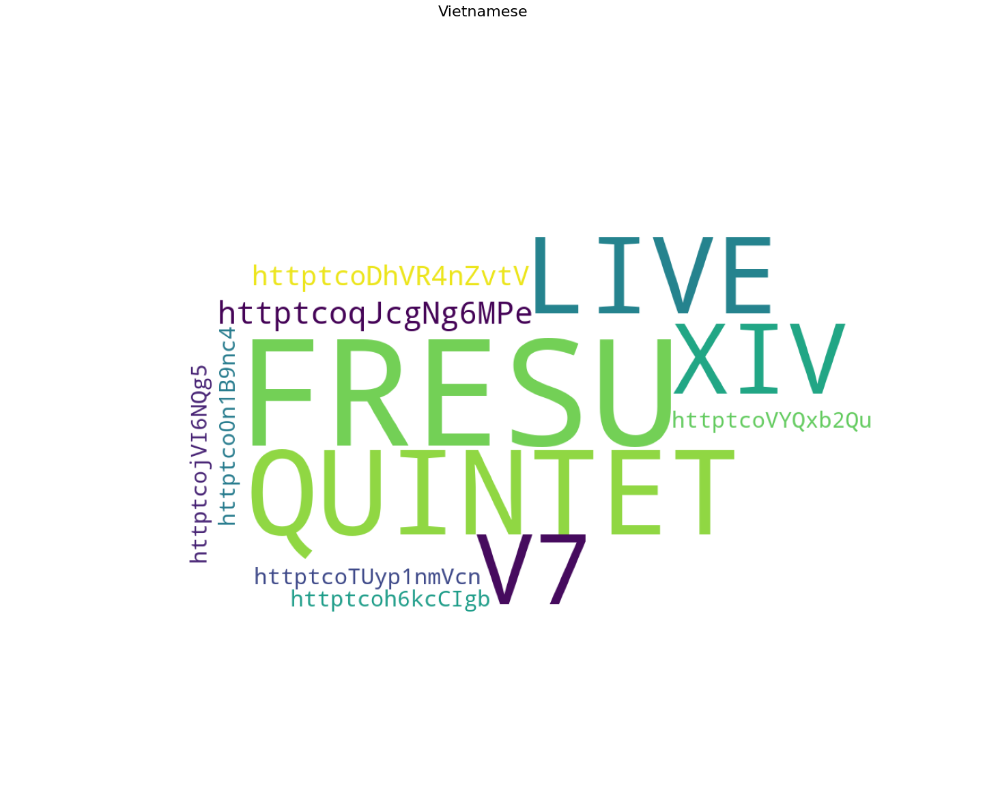

In [16]:
# for the wordcloud
mask = np.array(Image.open('cloud.png'))

for lang in df['Language'].unique().tolist():
    df2 = df[df['Language'] == lang]


    wordcloud = WordCloud(
                    width = 2000, 
                    height = 1334, 
                    random_state=1, 
                    background_color='white',                 
                    max_words = 200,
                    mask=mask,
                    collocations=False, 
                    normalize_plurals=False
                ).generate(' '.join(df2['bigram_text'].tolist()))

    fig = plt.figure(figsize=(25, 17), dpi=80)
    fig.suptitle(lang, fontsize=20)
    plt.tight_layout(pad=0)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.box(False)
    plt.show()
    plt.close()     